In [1]:
# !pip3 install opencv-contrib-python==3.4.2.17

import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
plt.rcParams["figure.figsize"] = (15, 15)

In [2]:
def read_image(path):
    """Realiza a leitura de uma imagem

    :param path: caminho do imagem a ser lida

    :return: Imagem lida (ndarray)
    """
    if path is not None and type(path) == str:
        img = cv2.imread(path)
        return img
    else:
        raise ValueError("Imagem não encontrada!")

In [3]:
def to_black_and_white(image):
    """Recebe uma imagem colorida possuindo canais BGR
        e a converte para B&W


    :param image: imagem a ser convertida

    :return: Imagem possuindo apenas 1 canal de cor (ndarray)
    """
    black_and_white_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return black_and_white_image

In [4]:
def plot_img(image):
    """
        Realiza o plot de uma imagem

    :param image: imagem a ser mostrada. Por padrão, assume que
        ela foi lida pelo opencv e possui 3 canais.

    :return: None
    """
    cvt_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.axis("off")
    plt.imshow(cvt_image)
    plt.show()

In [5]:
def remove_black_columns(image):
    """Recebe uma imagem e remove todas as colunas contendo apenas
        pixels pretos

    :param image: imagem a ser modificada

    :return: imagem após a modificação (ndarray)
    """
    #Seleciona os indices das colunas em que todos os canais possuem valor zero
    idxs = np.argwhere(np.all(image[..., :] == 0, axis = 0))

    #Realiza a deleção das colunas
    output = np.delete(image, idxs, axis=1)

    return output

In [6]:
def select_detector(name=None):
    """Retorna a classe de uma detector de features
        Disponiveis: sift, surf, star e orb.

    :param name: nome do detector selecionado
    :return: classe reference ao detector
    """
    return select_descriptor(name)

In [7]:
def select_descriptor(name=None):
    """Retorna o descritor passado como parâmetro.
        Disponiveis: sift, surf, star e orb.

    :param name: nome do descritor selecionado

    :return: a classe referente ao descritor
    """

    #Dicionado com os descritores utilizados
    descriptors = {
        "sift": cv2.xfeatures2d.SIFT_create(),
        "surf": cv2.xfeatures2d.SURF_create(),
        "brief": cv2.xfeatures2d.BriefDescriptorExtractor_create(),
        "star": cv2.xfeatures2d.StarDetector_create(),
        "orb": cv2.ORB_create()
    }

    #Se o nome passado não está no dicionário, então emite um erro
    if name not in descriptors.keys():
        raise ValueError("Descritor não encontrado!")

    return descriptors[name]

In [8]:
def select_norm(name=None):
    """ Seleciona o tipo de norma utilizada no matcher

    :param name: nome do descritor utilizado no momento
    :return: retorna a norma de acordo com o descritor
    """

    norm = None
    #Documentação do opencv recomenda a utilização da norma L2 para
    #os classificadores sift e surf
    if name in ["sift", "surf"]:
        norm = cv2.NORM_L2
    else:
        norm = cv2.NORM_HAMMING

    return norm

In [9]:
def select_detector_descriptor(name=None):
    """ Seleciona as classes do detector e descritor de features

    :param name: nome do método utilizado
    :return: tupla contendo o detector e descritor
    """
    output = None

    #Se o detector for star, o descritor será o brief
    #Caso contrário, o detector e descritor serão iguais
    first, second = name, "brief" if name == "star" else name
    output = (select_detector(first), select_descriptor(second))

    return output

In [10]:
def find_keypoints(img_1, img_2, algorithm=None):
    """Aplica o método de detecção e descrição nas duas imagens

    :param img_1: primeira imagem de referencia (preto e branco)
    :param img_2: segundo imagem de referencia (preto e branco)
    :param algorithm: algoritimo a ser utilizado

    :return: duas tuplas contendo os keypoints e descritores de cada imagem
    """
    img_a_gray = to_black_and_white(img_1)
    img_b_gray = to_black_and_white(img_2)

    detector, descriptor = select_detector_descriptor(algorithm)

    keypts_a = detector.detect(img_a_gray, None)
    keypts_b = detector.detect(img_b_gray, None)

    keypts_a, features_a = descriptor.compute(img_1, keypts_a)
    keypts_b, features_b = descriptor.compute(img_2, keypts_b)

    return (keypts_a, features_a), (keypts_b, features_b)

In [11]:
def match_keypoints(data_1, data_2, norm=cv2.NORM_L2):
    """Realiza o match entre os keypoints recebidos como parâmetros

    :param data_1: tupla (keypoints, descritores) da imagem A
    :param data_2: tupla (keypoints, descritores) da imagem B
    :param norm: tipo de norma utilizada no match

    :return: todos matches encontrados entre os descritores A e B
    """
    _, features_a = data_1
    _, features_b = data_2
    
    #Ajusta o matcher (Brute Force) com a norma especificada
    matcher = cv2.BFMatcher(norm)

    #Realiza o match KNN
    matches = matcher.knnMatch(features_a, features_b, k=2)
    return matches


In [12]:
def select_matches(matches, ratio=0.7):
    """ Seleciona os melhores matches de acordo com um critério de limiar

    :param matches: todos os matches encontrados
    :param ratio: razão a ser utilizada no teste

    :return: lista com os matches selecionados
    """
    #Lista com os melhores matches
    selected = []

    #Teste do limiar para elimiar os matches indevidos (falso positivo)
    for m, n in matches:
        if m.distance < ratio*n.distance:
            selected.append(m)

    return selected

In [13]:
def calculate_homography(features_a, features_b, matches):
    """

    :param features_a: features encontradas pelo descritor da imagem A
    :param features_b: features encontradas pelo descritor da imagem B
    :param matches: melhores matches encontrados

    :return: a Matriz de homografia encontrada
    """
    if len(matches) > 4:
        #Seleciona os pontos de correspondencia
        points_a = np.float32([ features_a[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
        points_b = np.float32([ features_b[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

        #Encontra a matriz de homografia de acordo com as correspondencias
        H, _ = cv2.findHomography(points_a, points_b, cv2.RANSAC, 5.0)
        return H
    else:
        raise ValueError("são necessários pelo menos 4 pontos de interesse!")

In [14]:
def run_method(foto_a, foto_b, method="surf", ratio = 0.7, filename=None):
    """Executa um pipeline de execução com os parâmetros especificados

    :param foto_a: primeira foto utilizada como referência
    :param foto_b: segunda foto utilizada como referência
    :param method: método escolhido (surf, sift, orb ou star)
    :param ratio: fator multiplicativo usado na seleção dos matches
    :param filename: nome do arquivo em que será salvo o resultado final

    :return: None
    """

    data_a, data_b = find_keypoints(foto_a, foto_b, algorithm=method)

    #Seleciona a norma de acordo com o método passado como parâmetro
    norm = select_norm(method)

    #Realiza o match dos keypoints
    matches = match_keypoints(data_a, data_b, norm=norm)

    #Seleciona os melhores matches
    best_matches = select_matches(matches, ratio=ratio)

    #Calcula a matriz de homografia
    H = calculate_homography(data_a[0], data_b[0], best_matches)

    # Guarda as dimensões das duas imagens, com exceção da quantidade de canais
    hl, wl = foto_a.shape[:-1]
    hr, wr = foto_b.shape[:-1]

    #Aplica a projeção perspectiva com a matriz H calculada
    output = cv2.warpPerspective(foto_a, H, (wr + wl, max(hr,hl)))

    #Resultado final será a imagem anterior à direita e a foto B à esquerda
    final_image = output.copy()
    final_image[0:hr, 0:wr] = foto_b

    #Remoção das colunas pretas para uma melhor visualização
    final_image = remove_black_columns(final_image)

    #Salva a imagem dos matches e a resultante
    img_filename = filename if filename is not None else method
    
    #Mostra os metches com base nos pontos de interesse
    matches_img = cv2.drawMatches(foto_a, data_a[0], foto_b, data_b[0], best_matches, None, flags=2)

    plot_img(matches_img)
    cv2.imwrite(f"./output/{img_filename}-{method}-matches-{ratio}.jpeg", matches_img)
    cv2.imwrite(f"./output/{img_filename}-{method}-{ratio}.jpeg", final_image)

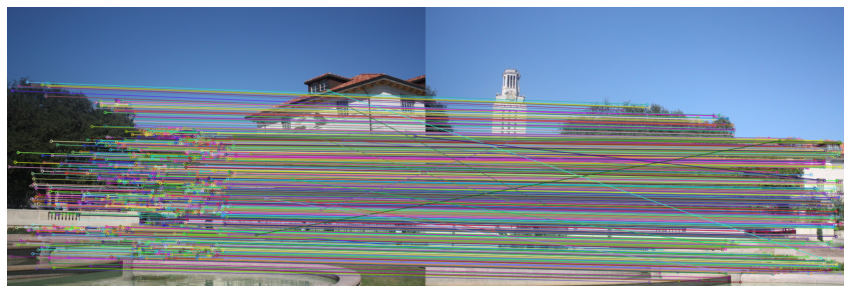

foto1A.jpg e foto1B.jpg com método: sift - Feito!
foto1A.jpg e foto1B.jpg com método: surf - Feito!
foto1A.jpg e foto1B.jpg com método: star - Feito!
foto1A.jpg e foto1B.jpg com método: orb - Feito!
foto2A.jpg e foto2B.jpg com método: sift - Feito!
foto2A.jpg e foto2B.jpg com método: surf - Feito!
foto2A.jpg e foto2B.jpg com método: star - Feito!
foto2A.jpg e foto2B.jpg com método: orb - Feito!
foto3A.jpg e foto3B.jpg com método: sift - Feito!
foto3A.jpg e foto3B.jpg com método: surf - Feito!
foto3A.jpg e foto3B.jpg com método: star - Feito!
foto3A.jpg e foto3B.jpg com método: orb - Feito!
foto4A.jpg e foto4B.jpg com método: sift - Feito!
foto4A.jpg e foto4B.jpg com método: surf - Feito!
foto4A.jpg e foto4B.jpg com método: star - Feito!
foto4A.jpg e foto4B.jpg com método: orb - Feito!
------------------------------------------------------------
são necessários pelo menos 4 pontos de interesse!
foto5A.jpg e foto5B.jpg com método: sift - Falhou!
------------------------------------------

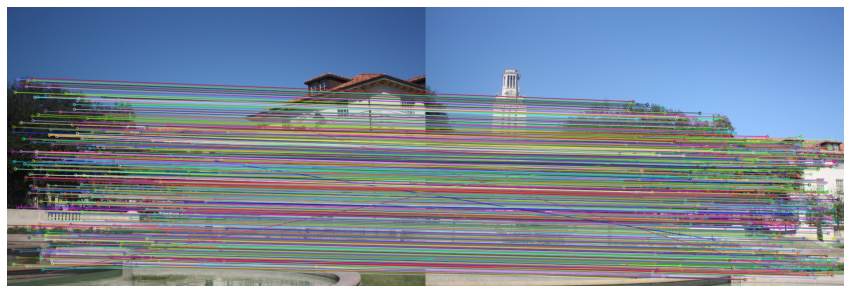

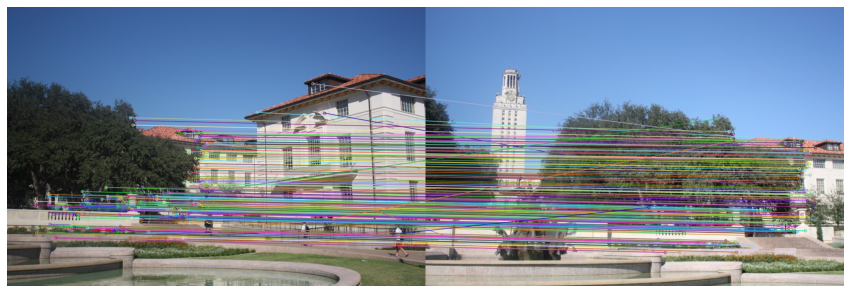

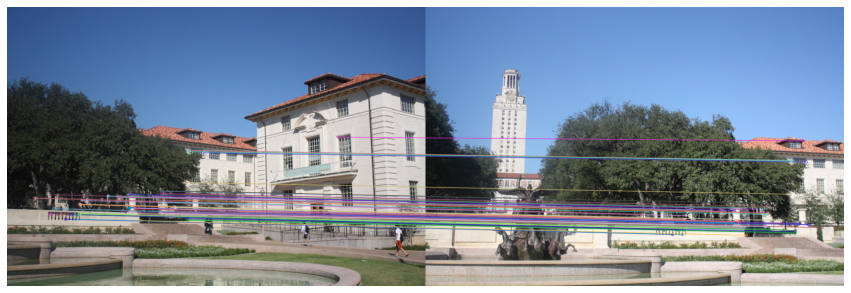

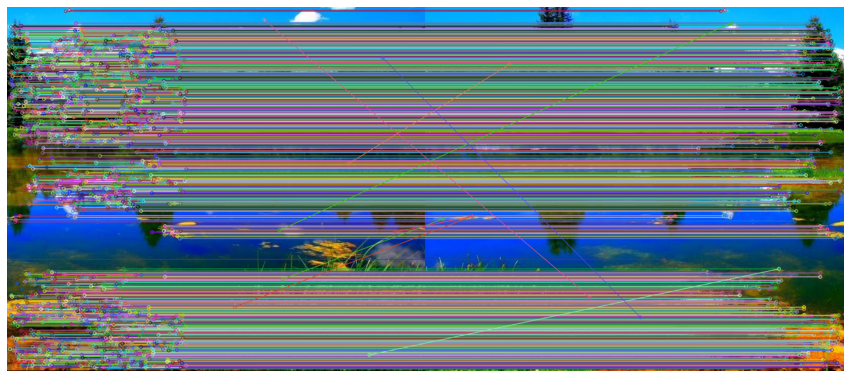

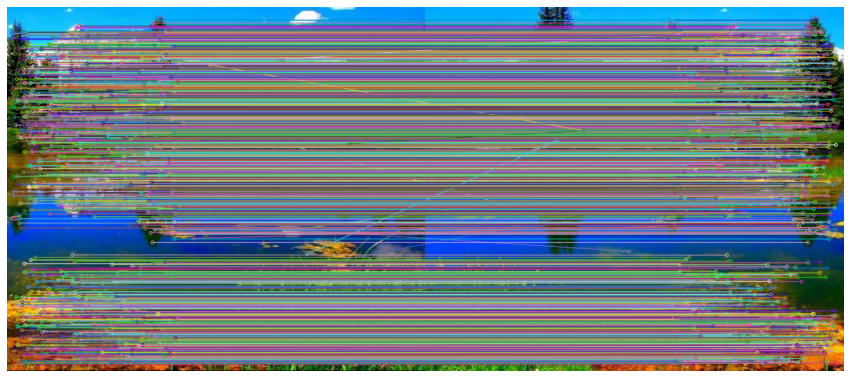

...

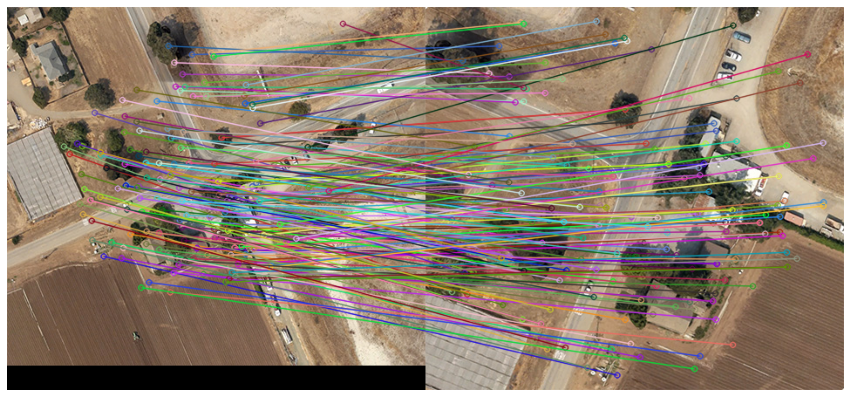

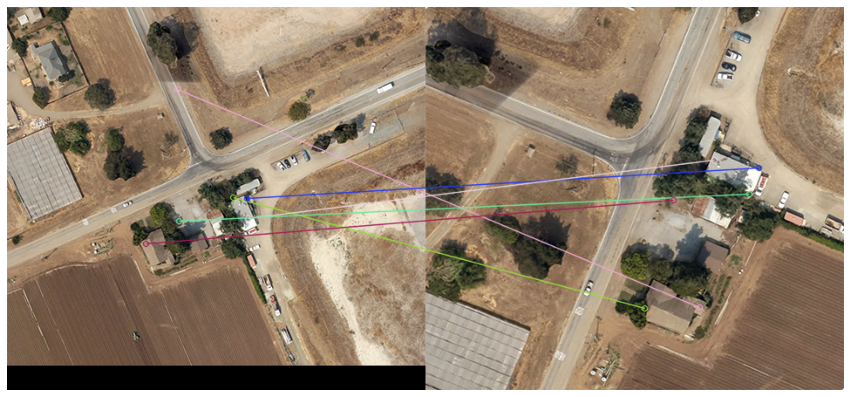

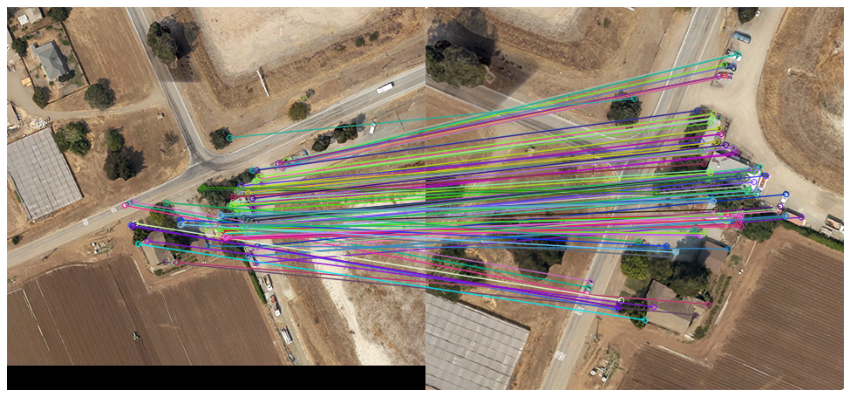

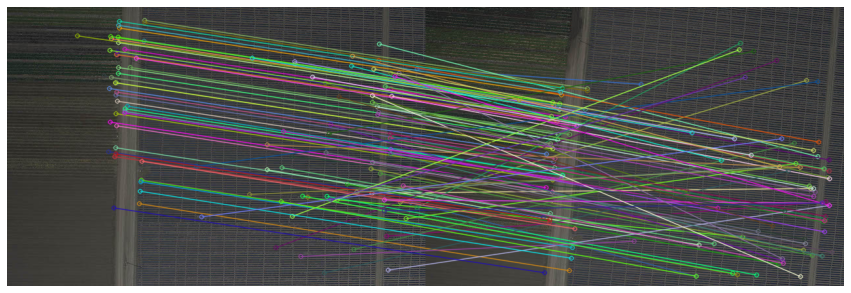

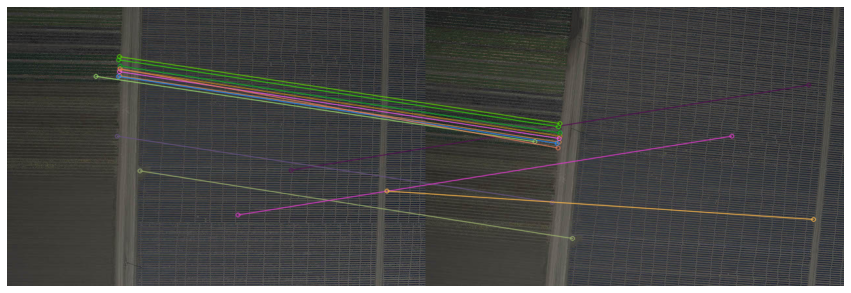

In [15]:
input_folder = "./images/"

imgs_name = [("foto1A.jpg", "foto1B.jpg", "Foto1"),
             ("foto2A.jpg", "foto2B.jpg", "Foto2"),
             ("foto3A.jpg", "foto3B.jpg", "Foto3"),
             ("foto4A.jpg", "foto4B.jpg", "Foto4"),
             ("foto5A.jpg", "foto5B.jpg", "Foto5")]

for A_filename, B_filename, final_filename in imgs_name:
    foto_a = read_image(os.path.join(input_folder, A_filename))
    foto_b = read_image(os.path.join(input_folder, B_filename))
    for method in ["sift", "surf", "star", "orb"]:
        try:
            run_method(foto_a, foto_b, method=method, ratio=0.70, filename=final_filename)
            print(f"{A_filename} e {B_filename} com método: {method} - Feito!")
        except ValueError as err:
            print(30*"--")
            print(f"{err}\n{A_filename} e {B_filename} com método: {method} - Falhou!")
            print(30*"--")
            continue
